Advanced Lane Finding Project

The goals / steps of this project are the following:

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
Apply a distortion correction to raw images.
Use color transforms, gradients, etc., to create a thresholded binary image.
Apply a perspective transform to rectify binary image ("birds-eye view").
Detect lane pixels and fit to find the lane boundary.
Determine the curvature of the lane and vehicle position with respect to center.
Warp the detected lane boundaries back onto the original image.
Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

# Import libraries

In [10]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from collections import deque
%matplotlib inline

# Camera Calibration
Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [7]:
nx = 9;
ny = 6;
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
# termination criteria
#criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
fnames = glob.glob('./camera_cal/calibration*.jpg')
ftestnames = glob.glob('./test_images/test*.jpg')

/calibration15.jpg
/calibration9.jpg
/calibration13.jpg
/calibration14.jpg
/calibration8.jpg
/calibration6.jpg
/calibration11.jpg
/calibration18.jpg
/calibration3.jpg
/calibration16.jpg
/calibration7.jpg
/calibration17.jpg
/calibration2.jpg
/calibration12.jpg
/calibration10.jpg
/calibration20.jpg
/calibration19.jpg


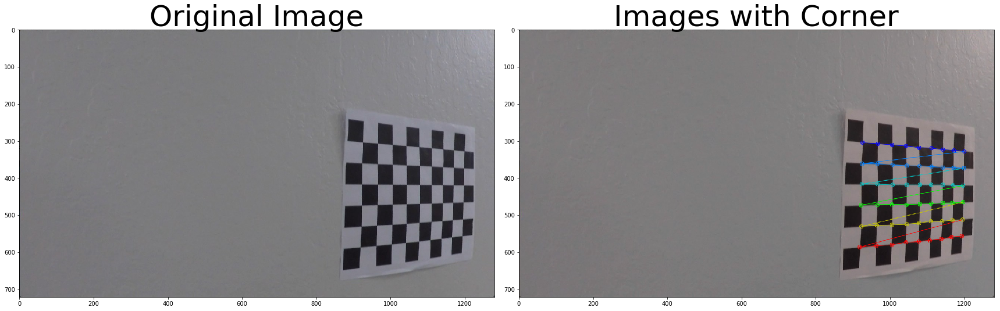

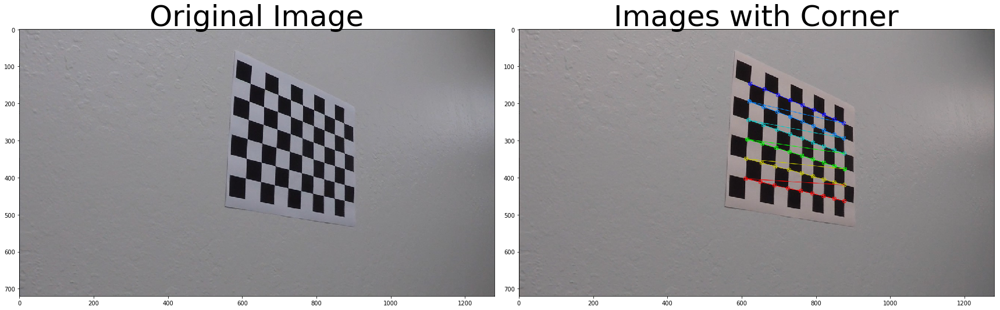

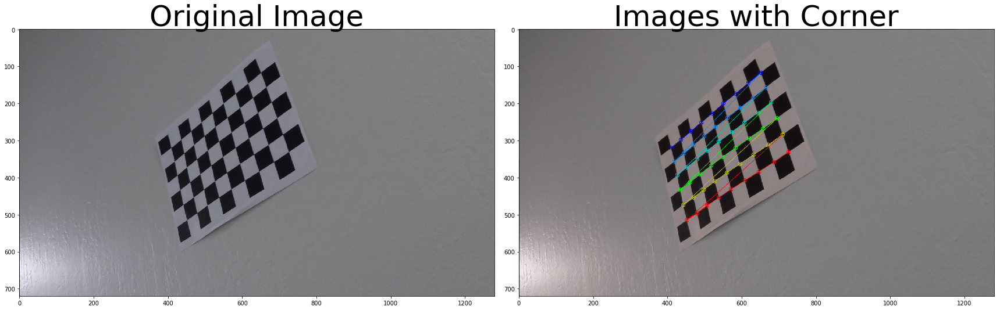

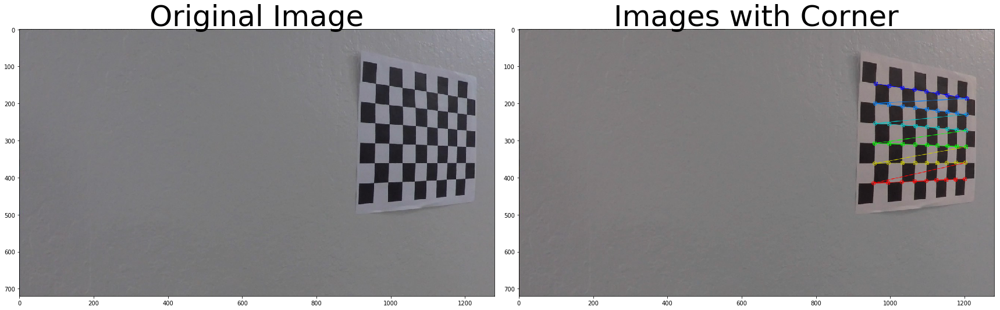

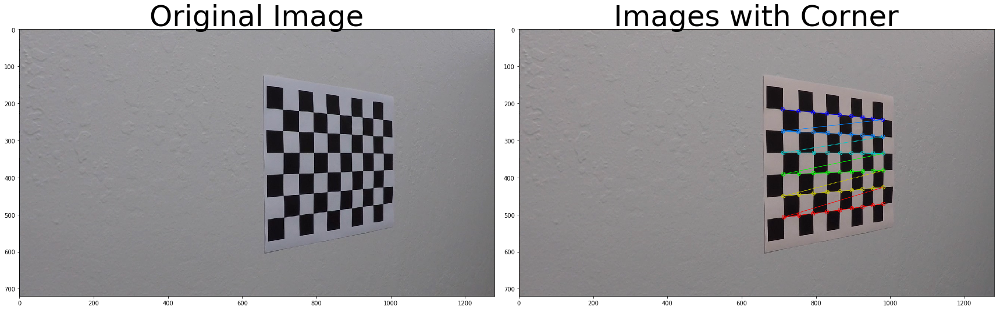

...

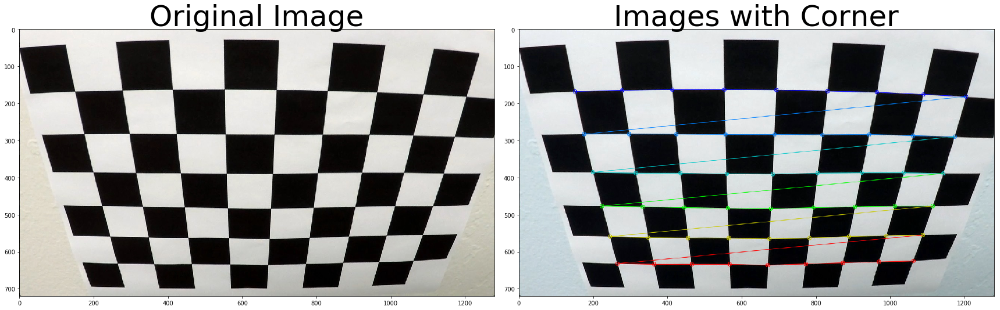

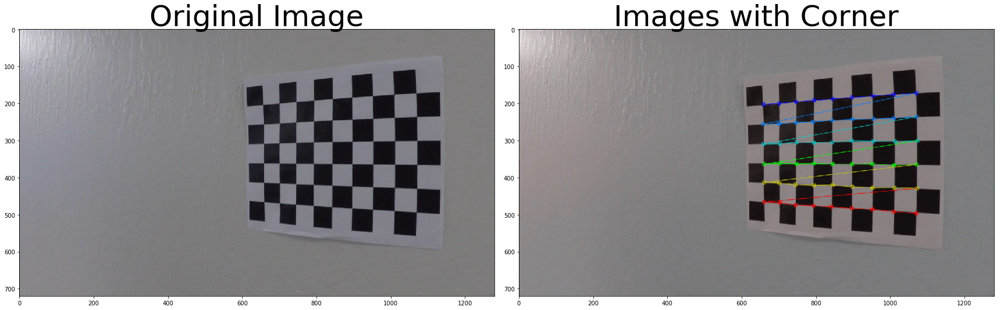

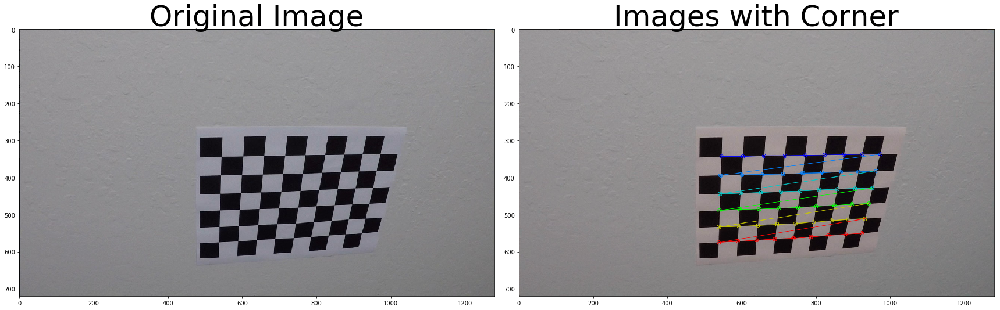

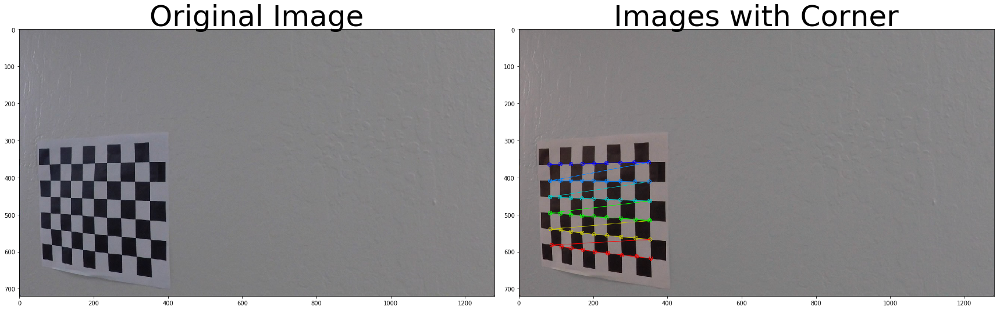

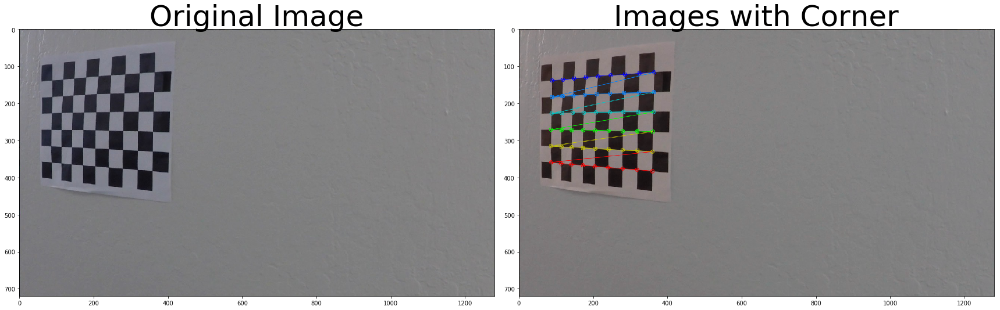

In [21]:

def draw_chase_corners(fname):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        image = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        return  objpoints, imgpoints,image
    return objpoints, imgpoints,None

for fname in fnames:
    objpoints, imgpoints,image = draw_chase_corners(fname)
   
    if image is not None:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(mpimg.imread(fname))
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(image)
        ax2.set_title('Images with Corner', fontsize=50)
        cv2.imwrite('./output_images/images_with_corner'+fname[12:len(fname)],image)
        #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
       
    

# Apply a distortion correction to raw images.

In [8]:
def cal_undistort(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist,ret, mtx, dist, rvecs, tvecs


#  Apply a distortion correction to test images.

In [ ]:

for fname in ftestnames:
    img = mpimg.imread(fname)
    undist,ret, mtx, dist, rvecs, tvecs = cal_undistort(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(mpimg.imread(fname))
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undist)
    ax2.set_title('Undisorted image', fontsize=50)
    cv2.imwrite('./output_images/undistorted'+fname[12:len(fname)],image)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Use color transforms, gradients, etc., to create a thresholded binary image.

TypeError: 'numpy.ndarray' object is not callable

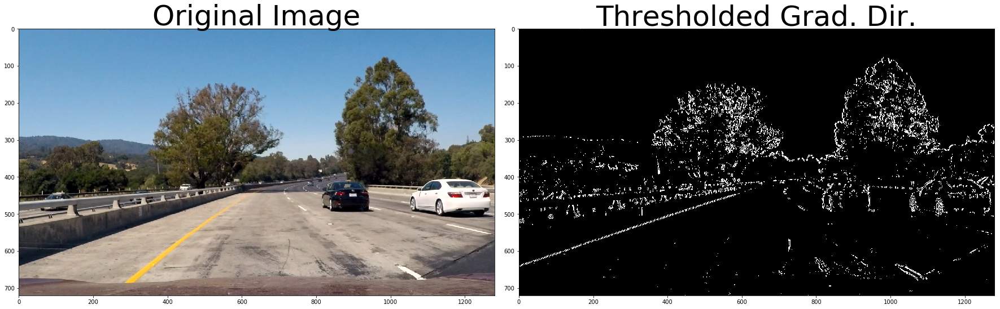

In [11]:

# Read in an image
#image = mpimg.imread(ftestnames[4])
ksize = 15 # Choose a larger odd number to smooth gradient measurements
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    #abs_sobel= np.sqrt(abs_sobelx**2 + abs_sobely**2)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # 5) Create a binary mask where direction thresholds are met
    dir_binary =  np.zeros_like(absgraddir)
    # 6) Return this mask as your binary_output image
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    #binary_output = np.copy(img) # Remove this line
    return dir_binary
def abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return grad_binary
def mag_thresh(img, sobel_kernel=7, mag_thresh=(70, 100)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    abs_sobel= np.sqrt(abs_sobelx**2 + abs_sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    # 6) Return this mask as your binary_output image
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    #binary_output = np.copy(img) # Remove this line
    return mag_binary   
def combined_thresh(image):
    #image = mpimg.imread(fname)
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(30, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(70,100))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
    combined_thresh = np.zeros_like(dir_binary)
    combined_thresh[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined_thresh, dir_binary, mag_binary
for ftest in ftestnames:
    image = mpimg.imread(ftest)
    combined_thresh, dir_binary, mag_binary = combined_thresh(image)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(combined_thresh, cmap='gray')
    ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

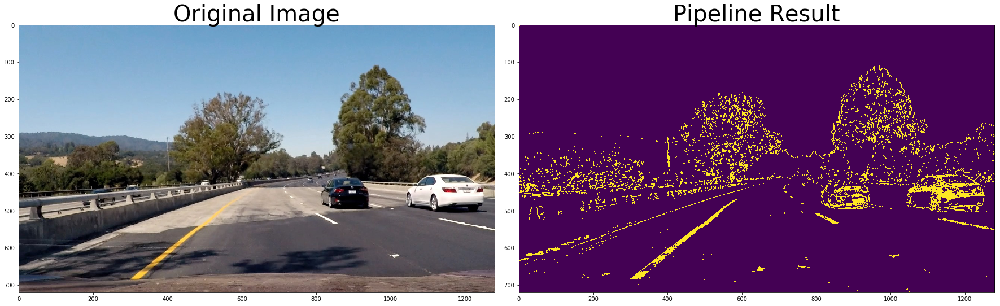

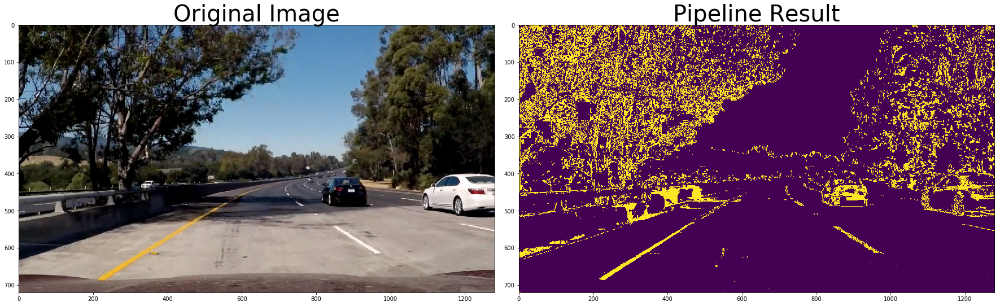

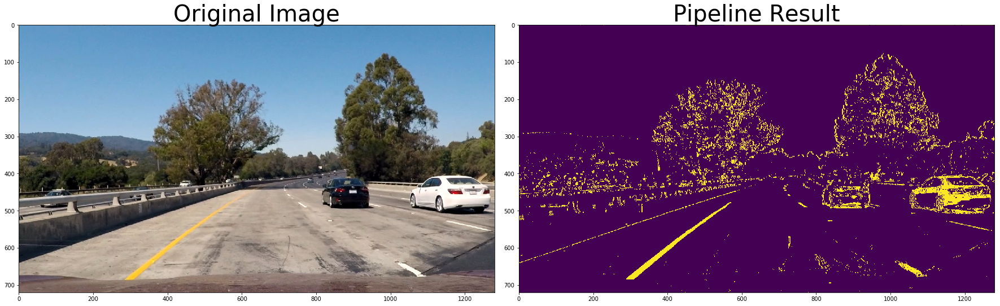

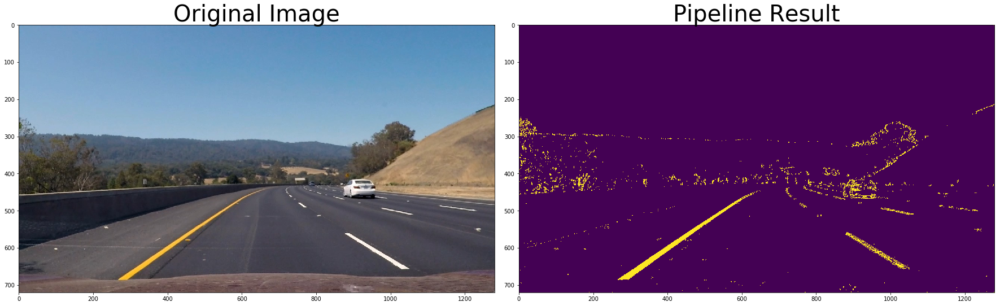

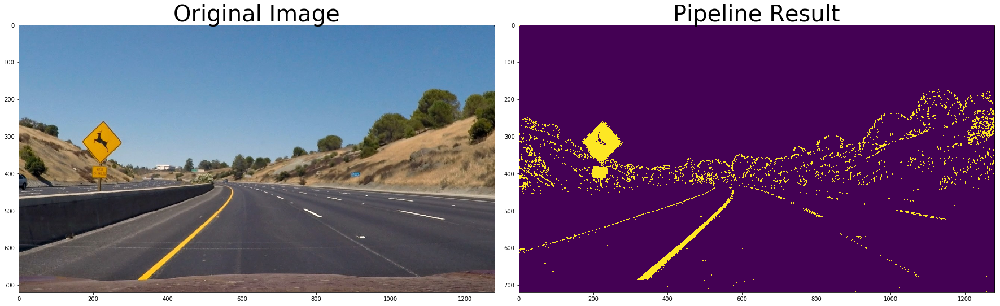

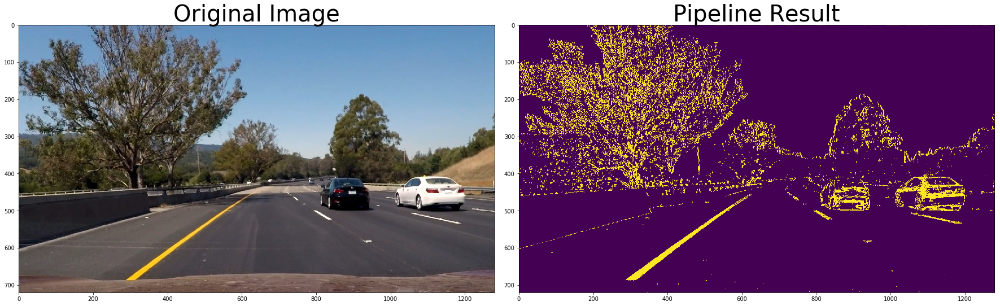

In [6]:
# Edit this function to create your own pipeline.
def combined_binary(img, s_thresh=(170, 255), sx_thresh=(30, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary, s_binary, sxbinary 
    
for fcombined in ftestnames:
    img = mpimg.imread(fcombined)
    result, s_binary, sxbinary = combined_binary(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result)
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Perspective transform

In [77]:
def unwrap(img):
    undist,ret, mtx, dist, rvecs, tvecs = cal_undistort(img)
    img_size = (undist.shape[1], undist.shape[0])
    src = np.float32(
            [[280,  700],  # Bottom left
             [595,  460],  # Top left
             [725,  460],  # Top right
             [1125, 700]]) # Bottom right

    dst = np.float32(
            [[250,  720],  # Bottom left
             [250,    0],  # Top left
             [1180,   0],  # Top right
             [1180, 720]]) # Bottom right 
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

#for fname in ftestnames:
#    img = mpimg.imread(fname)
#    warped, M, Minv = unwrap(img)
    #f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    #f.tight_layout()
    #ax1.imshow(img)
    #ax1.set_title('Original Image', fontsize=50)
    #ax2.imshow(top_down)
    #perspective_images.append(warped)
    #ax2.set_title('Undistorted and Warped Image', fontsize=50)
    #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [78]:
def hist(img):
    # TO-DO: Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # TO-DO: Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram



In [79]:
def pipeline(img):
    # Undistort
    img_undistort,ret, mtx, dist, rvecs, tvecs = cal_undistort(img)
    # Perspective Transform
    img_unwarp, M, Minv = unwrap(img_undistort)
    combined, s_binary, sxbinary = combined_binary(img_unwarp)
    return combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs

#for fpipeline in ftestnames:
#    img = mpimg.imread(fpipeline)
#    combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(img)
#    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#    f.tight_layout()
 #   ax1.imshow(img)
 #   ax1.set_title('Original Image', fontsize=40)
#    ax2.imshow(combined)
#    ax2.set_title('Pipeline Result', fontsize=40)
#    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


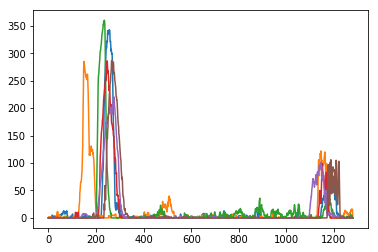

In [80]:
for fhist in ftestnames:
    img = mpimg.imread(fhist)
    combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(img)
    histogram = hist(combined)
    plt.plot(histogram)
   

In [81]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    data = (rectangle_data, histogram)
    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='green')
    plt.plot(right_fitx, ploty, color='green')
    return  out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, data


5686
22184


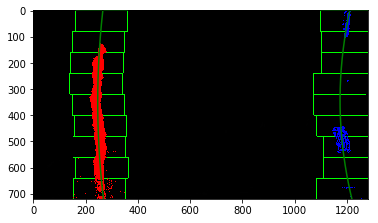

10767
22253


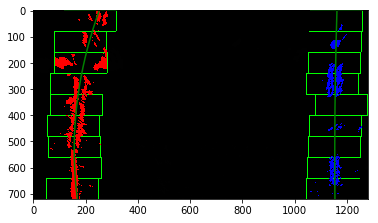

2967
16364


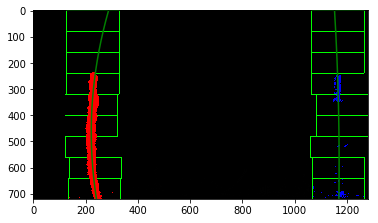

7024
18045


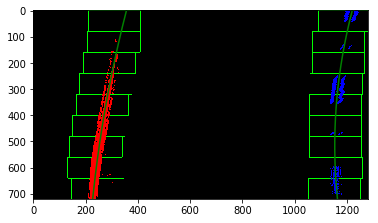

9184
28481


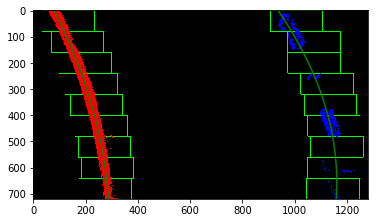

9763
20919


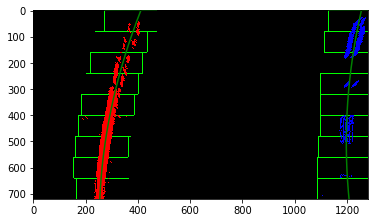

In [82]:
for windows in ftestnames:
    img = mpimg.imread(windows)
    combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(img)
    out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, data = find_lane_pixels(combined)
    print(len(right_lane_inds))
    print(len(left_lane_inds))
    plt.imshow(out_img)
    plt.show()

In [83]:
# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
left_fit = np.array([  3.05859351e-04 , -2.84243964e-01 ,  2.87965875e+02])
right_fit = np.array([ -5.13726710e-05 ,  5.99911866e-02 ,  1.15208818e+03])

def fit_poly(img_shape, leftx, lefty, rightx, righty,left_fit,right_fit):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped,left_fit,right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty,left_fit,right_fit)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='green')
    #plt.plot(right_fitx, ploty, color='green')
    ## End visualization steps ##
    
    return result,left_fitx,right_fitx, left_lane_inds, right_lane_inds
     

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits


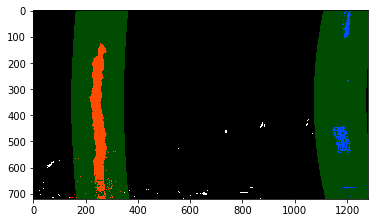

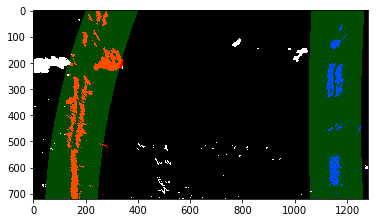

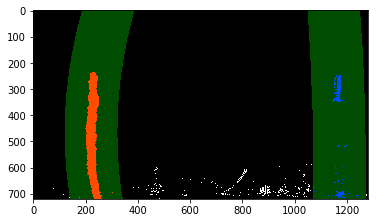

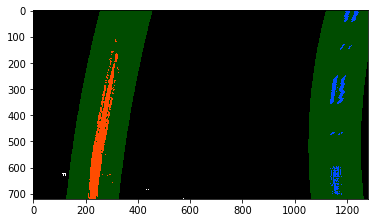

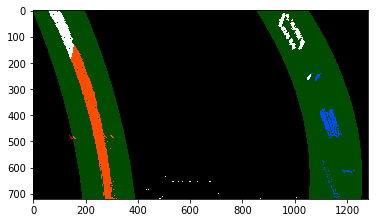

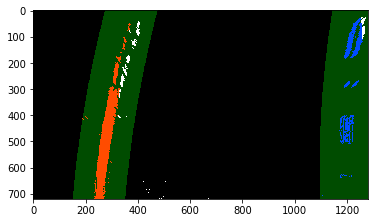

In [84]:
for trans in ftestnames:
    img = mpimg.imread(trans)
    combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(img)
    result,left_fitx,right_fitx, left_lane_inds, right_lane_inds = search_around_poly(combined,left_fit,right_fit)
    plt.imshow(result)
    plt.show()
 

# Measuring Curvature



In [85]:
# Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

# Lane Curvature



Radius of curvature for example: 298.170976856 m, 150.406012255 m
Distance from lane center for example: -1.01209938107 m
Radius of curvature for example: 140.513391811 m, 1755.77193589 m
Distance from lane center for example: -0.207387513893 m
Radius of curvature for example: 155.73723157 m, 923.784789729 m
Distance from lane center for example: -0.638778308216 m
Radius of curvature for example: 439.531478979 m, 189.579925061 m
Distance from lane center for example: -0.541804312886 m
Radius of curvature for example: 155.579574039 m, 91.3245359668 m
Distance from lane center for example: -0.811147865656 m
Radius of curvature for example: 195.755982121 m, 210.090020205 m
Distance from lane center for example: -0.891331176098 m


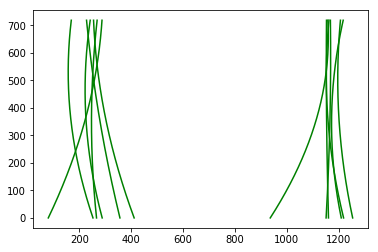

In [86]:
for lane in ftestnames:
    img = mpimg.imread(lane)
    combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(img)
    out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = find_lane_pixels(combined)
    rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(combined, left_fit, right_fit, left_lane_inds, right_lane_inds)

    print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
    print('Distance from lane center for example:', d_center, 'm')

In [87]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

In [88]:


#img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #plt.imshow(img)
        #plt.show()
        #cv2.imwrite('output_images/'+fname[12:],img)

In [89]:

def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

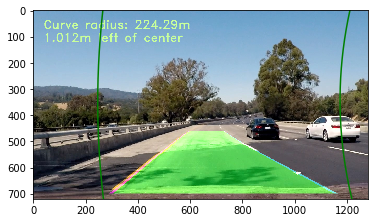

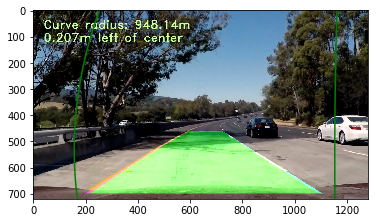

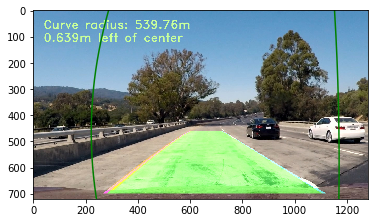

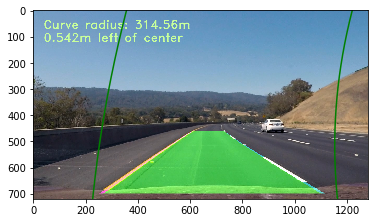

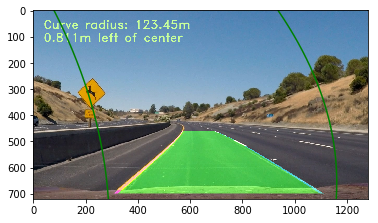

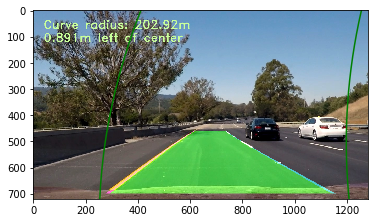

In [90]:
   
for draw in ftestnames:
    #plt.imshow(exampleImg_out1)
    img = mpimg.imread(draw)
    #plt.imshow(img)
    #plt.show()
    combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(img)
    out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = find_lane_pixels(combined)
    rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(combined, left_fit, right_fit, left_lane_inds, right_lane_inds)
    out = draw_lane(img, combined, left_fit, right_fit, Minv)
    out2 = draw_data(out, (rad_l+rad_r)/2, d_center)
    plt.imshow(out2)
    plt.show()
    #print('...')

In [32]:

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

        
        
   

    

In [101]:
def process_image(img):
    new_img = np.copy(img)
    img_bin, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        out_img, l_fit, r_fit, l_lane_inds, r_lane_inds, visualization_data = find_lane_pixels(img_bin)
        
    else:
         result,l_fit, r_fit, l_lane_inds, r_lane_inds = search_around_poly(img_bin, l_line.best_fit, r_line.best_fit)
       
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    
    
    return img_out,l_fit, r_fit,img_bin,Minv

In [102]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML



[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



100%|█████████▉| 200/201 [03:17<00:01,  1.03s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2min 56s, sys: 298 ms, total: 2min 56s
Wall time: 3min 21s


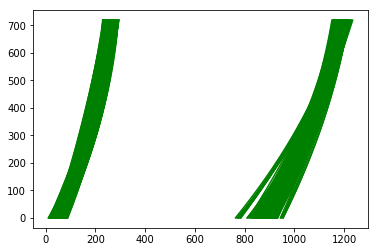

In [103]:
def process_image3(draw):
    combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(draw)
    out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = find_lane_pixels(combined)
    rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(combined, left_fit, right_fit, left_lane_inds, right_lane_inds)
    result = draw_lane(draw, combined, left_fit, right_fit, Minv)
    return result


l_line = Line()
r_line = Line()

def process_image2(draw):
    #combined, Minv, img_undistort,ret, mtx, dist, rvecs, tvecs = pipeline(draw)
    #out_img, left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = find_lane_pixels(combined)
    #rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(combined, left_fit, right_fit, left_lane_inds, right_lane_inds)
    img_out,l_fit, r_fit,img_bin,Minv = process_image(draw)
    result = draw_lane(draw, img_bin, left_fit, right_fit, Minv)
    return result
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4').subclip(0,8)
processed_video = video_input1.fl_image(process_image2)
%time processed_video.write_videofile(video_output1, audio=False)



In [104]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('project_video_output.mp4'))

[MoviePy] >>>> Building video challenge_result.mp4
[MoviePy] Writing video challenge_result.mp4



 64%|██████▎   | 309/485 [05:17<02:59,  1.02s/it]


100%|██████████| 485/485 [08:23<00:00,  1.23s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_result.mp4 



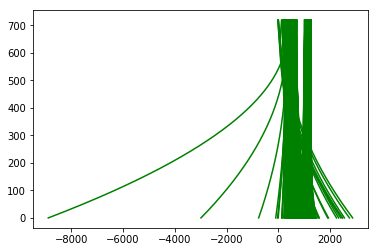

In [107]:
challenge_output = 'challenge_result.mp4'
clip1 = VideoFileClip("challenge_video.mp4")#.subclip(0,10)
challenge_clip = clip1.fl_image(process_image2)
challenge_clip.write_videofile(challenge_output, audio=False)

In [108]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('challenge_result.mp4'))

[MoviePy] >>>> Building video solidWhiteRight_output.mp4
[MoviePy] Writing video solidWhiteRight_output.mp4



 24%|██▍       | 303/1261 [05:12<17:36,  1.10s/it]


 48%|████▊     | 605/1261 [10:21<11:13,  1.03s/it]


 72%|███████▏  | 907/1261 [15:29<05:55,  1.00s/it]


 96%|█████████▌| 1205/1261 [20:31<00:57,  1.03s/it]


100%|█████████▉| 1260/1261 [21:27<00:01,  1.01s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: solidWhiteRight_output.mp4 



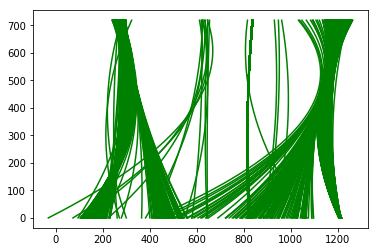

In [109]:


challenge_output = 'solidWhiteRight_output.mp4'
clip1 = VideoFileClip("solidWhiteRight.mp4")
challenge_clip = clip1.fl_image(process_image2)
challenge_clip.write_videofile(challenge_output, audio=False)

In [110]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('solidWhiteRight_output.mp4'))